N CHIRU SANDEEP
21BDS0236

Module - 2

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the dataset
file_path = '/content/supermarket_sales.csv'
df = pd.read_csv(file_path)
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,01/05/19,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,03/08/19,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,03/03/19,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,02/08/19,10:37,Ewallet,604.17,4.761905,30.2085,5.3


### Data preprocessing

In [7]:
# Check for missing values
print(df.isnull().sum())

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     2
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    1
cogs                       0
gross margin percentage    1
gross income               0
Rating                     1
dtype: int64


In [8]:
# Replace '?' with NaN
df.replace('?', np.nan, inplace=True)

In [9]:
# Fill missing values for numeric columns with mean
numeric_cols = df.select_dtypes(include=[np.number]).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

In [56]:
# Fill missing values for non-numeric columns with mode
non_numeric_cols = df.select_dtypes(exclude=[np.number]).columns
df[non_numeric_cols] = df[non_numeric_cols].fillna(df[non_numeric_cols].mode().iloc[0])

In [11]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile) for each numeric column
Q1 = df.select_dtypes(include=[np.number]).quantile(0.25) # Only include numeric columns
Q3 = df.select_dtypes(include=[np.number]).quantile(0.75) # Only include numeric columns
IQR = Q3 - Q1

# Remove rows with outliers
df_cleaned = df[~((df.select_dtypes(include=[np.number]) < (Q1 - 1.5 * IQR)) | (df.select_dtypes(include=[np.number]) > (Q3 + 1.5 * IQR))).any(axis=1)]

In [12]:
# Check for duplicates
duplicate_rows = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")


Number of duplicate rows: 0


In [13]:
# Cleaned dataset
print("Cleaned dataset:")
print(df.isnull().sum())

Cleaned dataset:
Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64


In [14]:
# More deeper about the cleaned dataset
df.isnull().sum().sum()

0

In [15]:
# Statistical summary for numerical columns
df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1.000000e+03,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905e+00,15.379369,6.973373
std,26.494628,2.923431,11.708825,245.885335,234.17651,2.810072e-17,11.708825,1.718448
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905e+00,0.508500,4.000000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905e+00,5.924875,5.500000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905e+00,12.088000,7.000000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905e+00,22.445250,8.500000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905e+00,49.650000,10.000000


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

In [17]:
# Convert 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Normalize 'Quantity' between 0 and 1
df['Quantity_normalized'] = (df['Quantity'] - df['Quantity'].min()) / (df['Quantity'].max() - df['Quantity'].min())

# Preview the updated DataFrame
df.head()


<ipython-input-17-2d3f5502d917>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'])


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Quantity_normalized
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,4.761905,26.1415,9.1,0.666667
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,4.761905,3.8200,9.6,0.444444
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23,Credit card,324.31,4.761905,16.2155,7.4,0.666667
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,0.777778
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37,Ewallet,604.17,4.761905,30.2085,5.3,0.666667


### Binning

In [18]:
# Equal-width binning for a column, e.g., 'Unit price'
bins = 10  # Specify the number of bins
df['Unit price_bin'] = pd.cut(df['Unit price'], bins=bins)

# Check the bin distribution
print(df['Unit price_bin'].value_counts())


Unit price_bin
(90.972, 99.96]     117
(19.068, 28.056]    113
(72.996, 81.984]    109
(46.032, 55.02]     105
(9.99, 19.068]       95
(64.008, 72.996]     95
(37.044, 46.032]     94
(28.056, 37.044]     91
(81.984, 90.972]     91
(55.02, 64.008]      90
Name: count, dtype: int64


In [19]:
# Equal-frequency binning for 'Total'
quantiles = 4  # Specify the number of quantiles (bins)
df['Total_bin'] = pd.qcut(df['Total'], q=quantiles)

# Check the bin distribution
print(df['Total_bin'].value_counts())


Total_bin
(10.677000000000001, 124.422]    250
(124.422, 253.848]               250
(253.848, 471.35]                250
(471.35, 1042.65]                250
Name: count, dtype: int64


In [20]:
# Define custom bin edges and labels for 'Rating'
bins = [0, 3, 6, 9, 10]  # Custom edges for rating
labels = ['Low', 'Medium', 'High', 'Very High']
df['Rating_bin'] = pd.cut(df['Rating'], bins=bins, labels=labels, include_lowest=True)

# Check the custom bin distribution
print(df['Rating_bin'].value_counts())


Rating_bin
High         508
Medium       341
Very High    151
Low            0
Name: count, dtype: int64


In [21]:
# Apply binning to multiple columns
columns_to_bin = ['Unit price', 'Quantity', 'Total']  # List of columns to bin
for col in columns_to_bin:
    df[f'{col}_bin'] = pd.cut(df[col], bins=5)  # Change bins as per your need

# Check results for each binned column
df[[f'{col}_bin' for col in columns_to_bin]].head()


,Unit price_bin,Quantity_bin,Total_bin
0,"(64.008, 81.984]","(6.4, 8.2]","(423.467, 629.861]"
1,"(9.99, 28.056]","(4.6, 6.4]","(9.647, 217.073]"
2,"(46.032, 64.008]","(6.4, 8.2]","(217.073, 423.467]"
3,"(46.032, 64.008]","(6.4, 8.2]","(423.467, 629.861]"
4,"(81.984, 99.96]","(6.4, 8.2]","(629.861, 836.256]"


### Discretization

In [22]:
from sklearn.preprocessing import KBinsDiscretizer

# KBinsDiscretizer applies binning and returns categories in a machine learning-compatible format
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform')

# Fit and transform the 'Unit price' column
df['Unit price_bin'] = discretizer.fit_transform(df[['Unit price']])

# Check results
df['Unit price_bin'].head()


,Unit price_bin
0,3.0
1,0.0
2,2.0
3,2.0
4,4.0


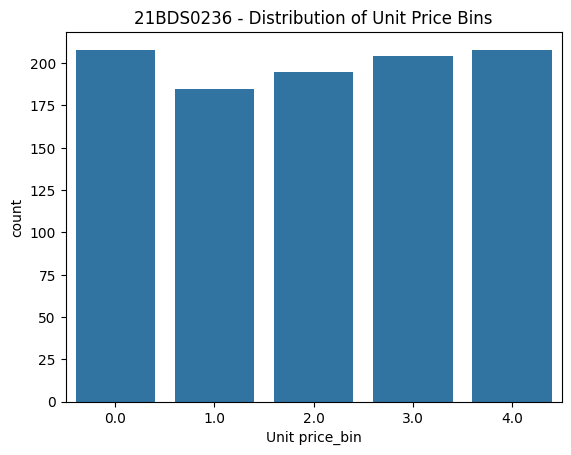

In [23]:
# Plot distribution of binned data
sns.countplot(x='Unit price_bin', data=df)
plt.title('21BDS0236 - Distribution of Unit Price Bins')
plt.show()

Module - 3

Univariate analysis

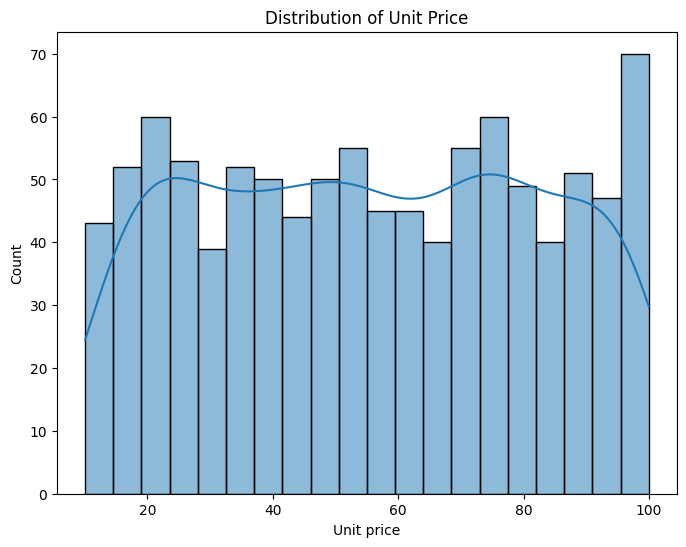

In [24]:
# Univariate analysis for numerical columns
# 1. Histogram for 'Unit price'
plt.figure(figsize=(8,6))
sns.histplot(df['Unit price'], bins=20, kde=True)
plt.title('Distribution of Unit Price')
plt.show()

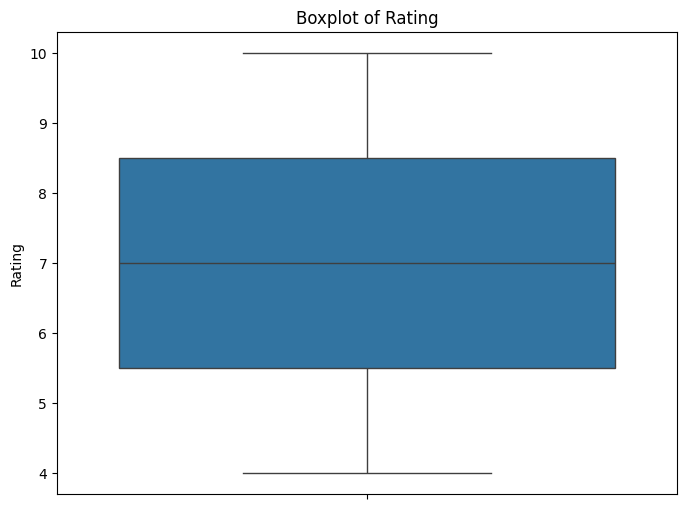

In [25]:
# 2. Boxplot for 'Rating'
plt.figure(figsize=(8,6))
sns.boxplot(df['Rating'])
plt.title('Boxplot of Rating')
plt.show()



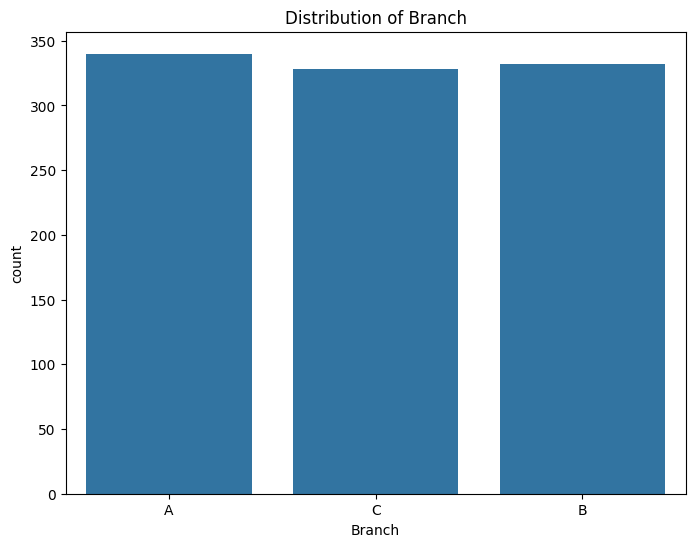

In [26]:
# 3. Bar plot for 'Branch' (categorical variable)
plt.figure(figsize=(8,6))
sns.countplot(x='Branch', data=df)
plt.title('Distribution of Branch')
plt.show()

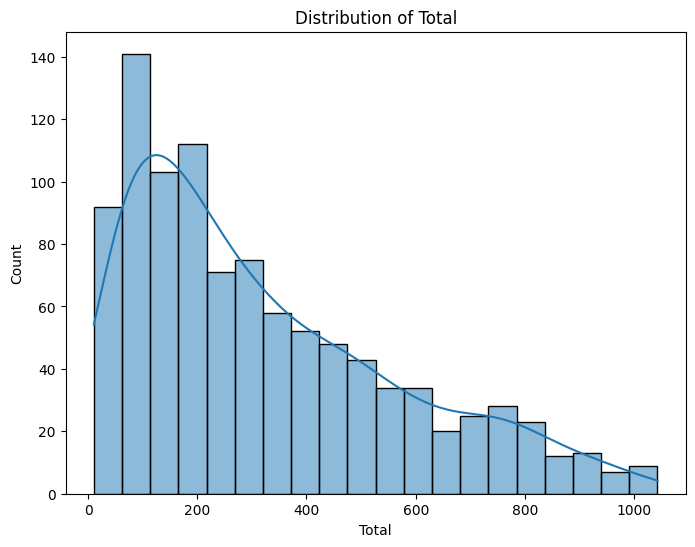

In [27]:
# 4. Histogram for 'Total'
plt.figure(figsize=(8,6))
sns.histplot(df['Total'], bins=20, kde=True)
plt.title('Distribution of Total')
plt.show()


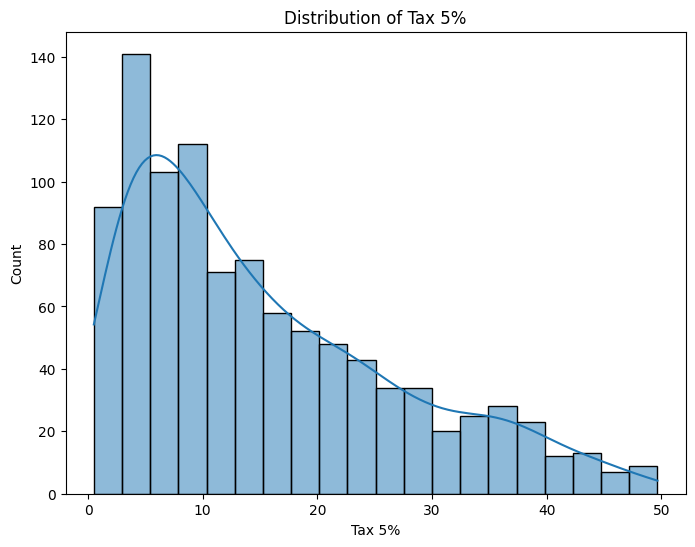

In [28]:
# 5. Histogram for 'Tax 5%'
plt.figure(figsize=(8,6))
sns.histplot(df['Tax 5%'], bins=20, kde=True)
plt.title('Distribution of Tax 5%')
plt.show()

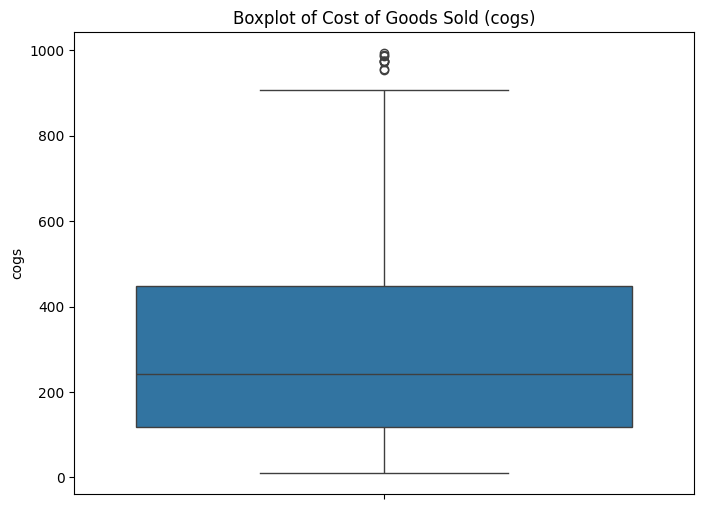

In [29]:
# 6. Boxplot for 'cogs'
plt.figure(figsize=(8,6))
sns.boxplot(df['cogs'])
plt.title('Boxplot of Cost of Goods Sold (cogs)')
plt.show()

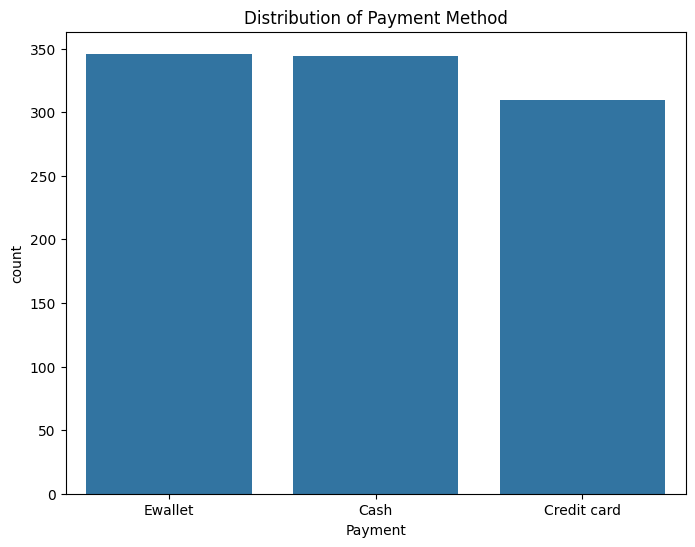

In [30]:
# 7. Bar plot for 'Payment'
plt.figure(figsize=(8,6))
sns.countplot(x='Payment', data=df)
plt.title('Distribution of Payment Method')
plt.show()

Bivariate analysis

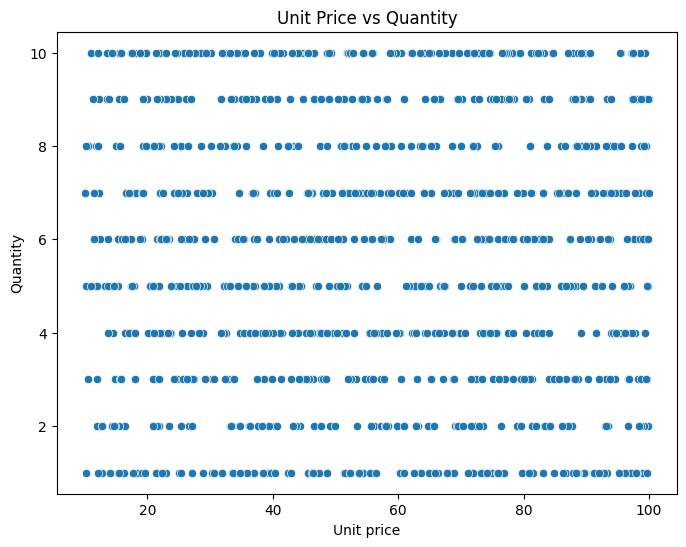

In [31]:
# 1. Scatter plot for 'Unit price' vs. 'Quantity'
plt.figure(figsize=(8,6))
sns.scatterplot(x='Unit price', y='Quantity', data=df)
plt.title('Unit Price vs Quantity')
plt.show()

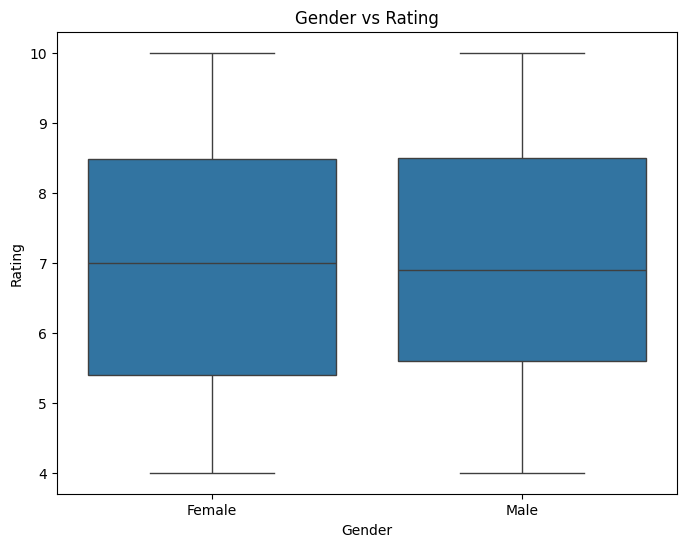

In [32]:
# 2. Boxplot for 'Gender' vs. 'Rating'
plt.figure(figsize=(8,6))
sns.boxplot(x='Gender', y='Rating', data=df)
plt.title('Gender vs Rating')
plt.show()

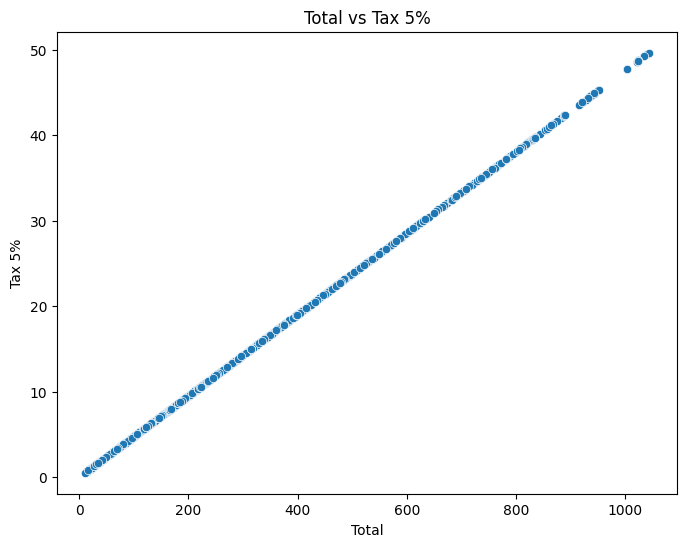

In [33]:
# 3. Scatter plot for 'Total' vs. 'Tax 5%'
plt.figure(figsize=(8,6))
sns.scatterplot(x='Total', y='Tax 5%', data=df)
plt.title('Total vs Tax 5%')
plt.show()

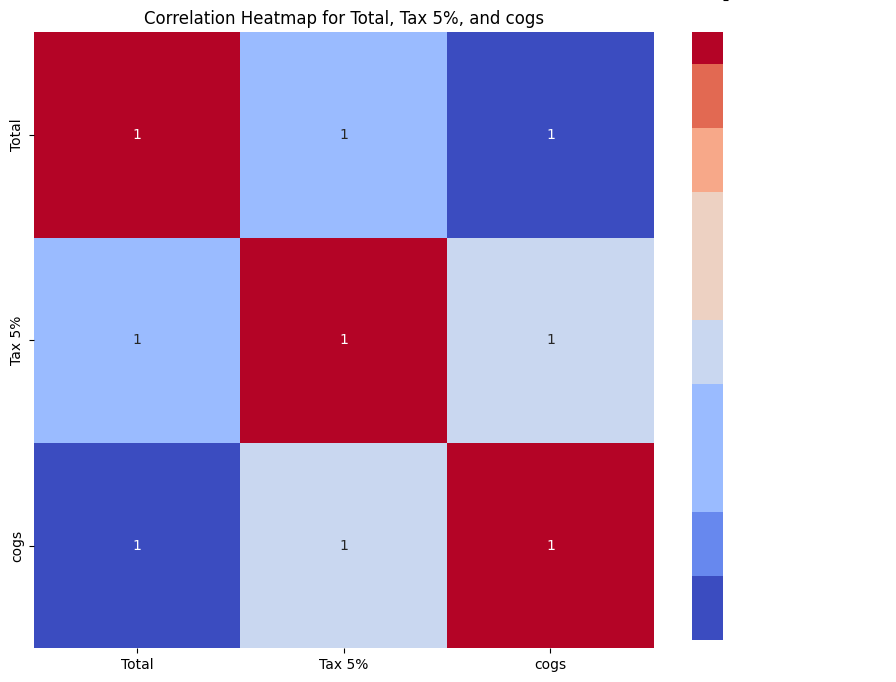

In [34]:
# 4. Correlation Heatmap for 'Total', 'Tax 5%', and 'cogs'
plt.figure(figsize=(10,8))
sns.heatmap(df[['Total', 'Tax 5%', 'cogs']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap for Total, Tax 5%, and cogs')
plt.show()

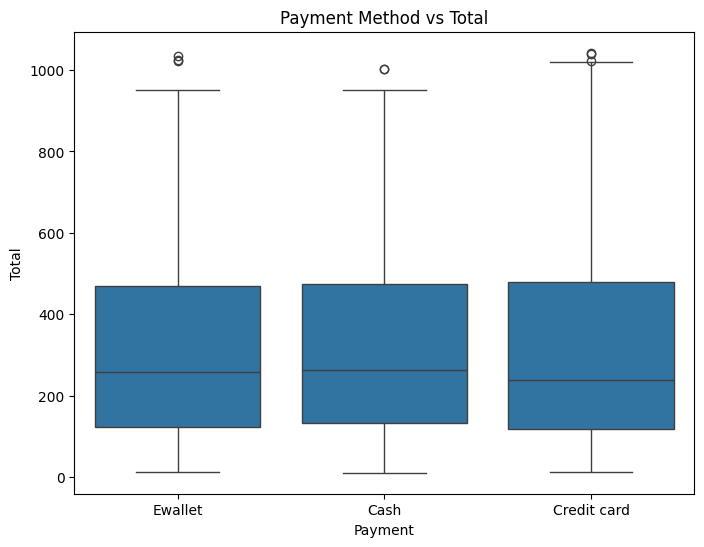

In [35]:
# 5. Boxplot for 'Payment' vs. 'Total'
plt.figure(figsize=(8,6))
sns.boxplot(x='Payment', y='Total', data=df)
plt.title('Payment Method vs Total')
plt.show()

Multivariate analysis

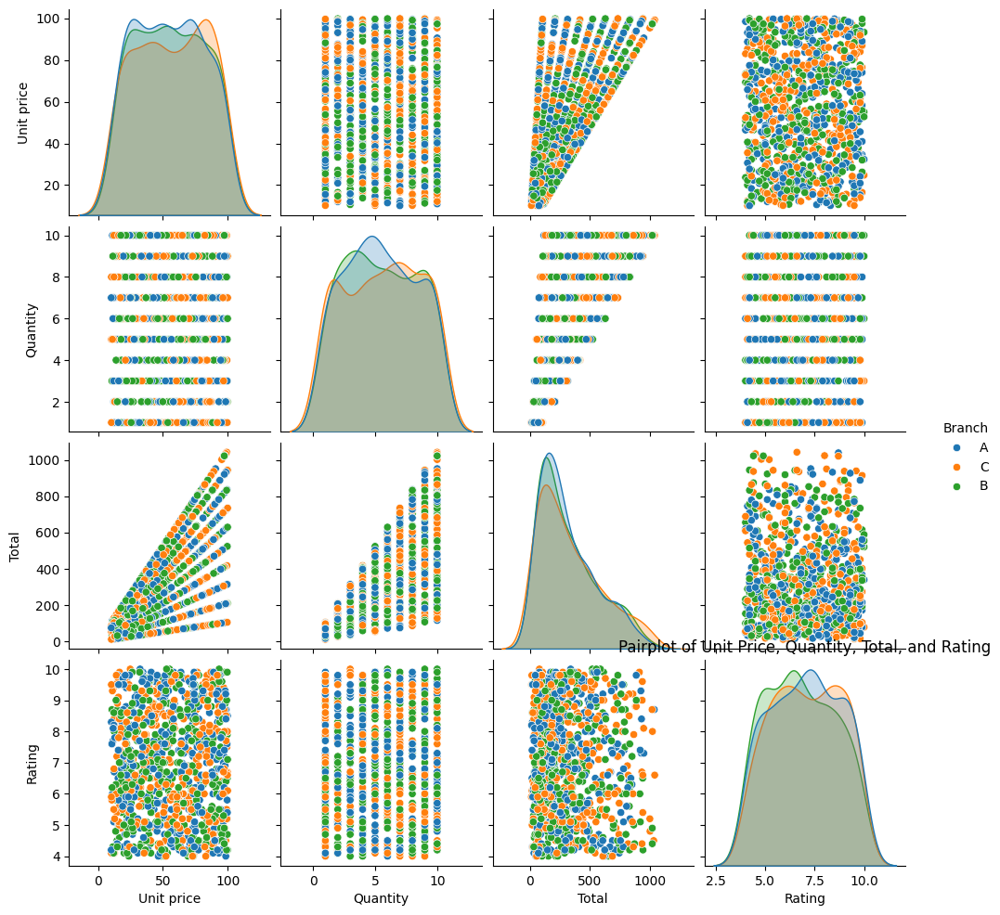

In [36]:
# 1. Pairplot for selected numeric variables
sns.pairplot(df[['Unit price', 'Quantity', 'Total', 'Rating', 'Branch']], hue='Branch') # Added 'Branch' to the list of columns
plt.title('Pairplot of Unit Price, Quantity, Total, and Rating')
plt.show()

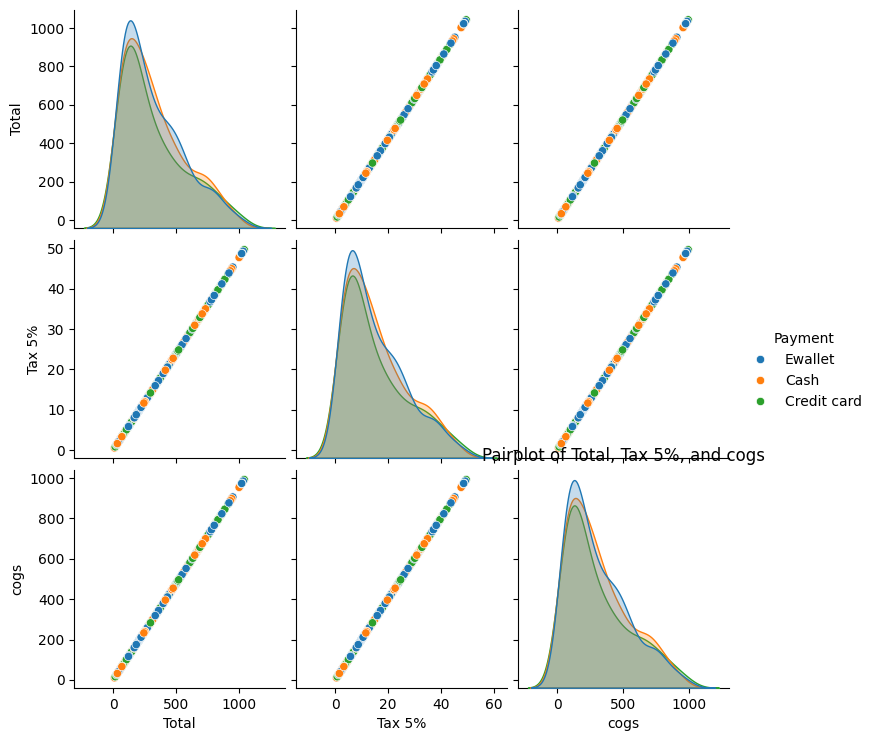

In [37]:
# 2. Pairplot for 'Total', 'Tax 5%', and 'cogs'
sns.pairplot(df[['Total', 'Tax 5%', 'cogs', 'Payment']], hue='Payment')
plt.title('Pairplot of Total, Tax 5%, and cogs')
plt.show()

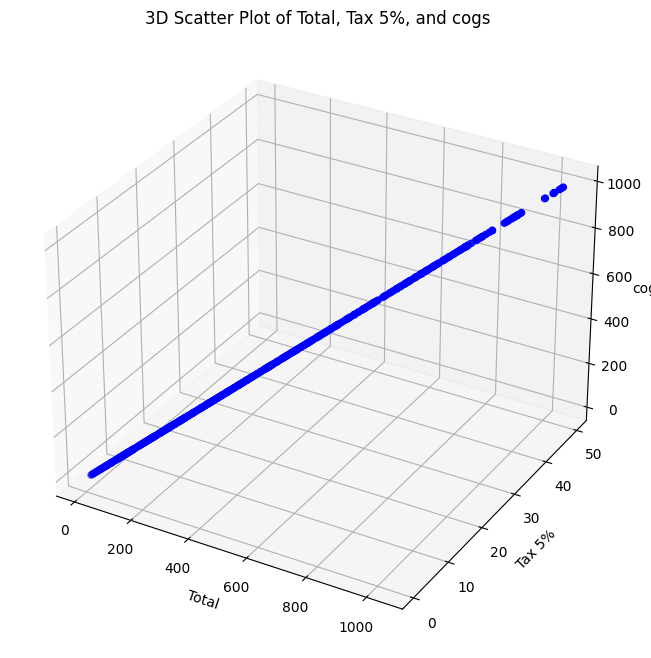

In [38]:
# 3. 3D Scatter Plot for 'Total', 'Tax 5%', and 'cogs'
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

# 3D scatter plot for 'Total', 'Tax 5%', and 'cogs'
ax.scatter(df['Total'], df['Tax 5%'], df['cogs'], c='b', marker='o')

ax.set_xlabel('Total')
ax.set_ylabel('Tax 5%')
ax.set_zlabel('cogs')
plt.title('3D Scatter Plot of Total, Tax 5%, and cogs')
plt.show()

Time series analysis

In [39]:
df['Date'] = pd.to_datetime(df['Date'])
df.dtypes


,0
Invoice ID,object
Branch,object
City,object
Customer type,object
Gender,object
Product line,object
Unit price,float64
Quantity,int64
Tax 5%,float64
Total,float64


In [40]:
# change the index of our data to the Date column
df = df.set_index('Date')
df.tail(3)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,Payment,cogs,gross margin percentage,gross income,Rating,Quantity_normalized,Unit price_bin,Total_bin,Rating_bin,Quantity_bin
Date,,,,,,,,,,,,,,,,,,,,,
2019-02-09,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.592,33.432,...,Cash,31.84,4.761905,1.592,7.7,0.000000,1.0,"(9.647, 217.073]",High,"(0.991, 2.8]"
2019-02-22,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.291,69.111,...,Cash,65.82,4.761905,3.291,4.1,0.000000,3.0,"(9.647, 217.073]",Medium,"(0.991, 2.8]"
2019-02-18,849-09-3807,A,Yangon,Member,Female,Fashion accessories,88.34,7,30.919,649.299,...,Cash,618.38,4.761905,30.919,6.6,0.666667,4.0,"(629.861, 836.256]",High,"(6.4, 8.2]"


In [41]:
# Verifying the 'Date'
df.index

DatetimeIndex(['2019-01-05', '2019-03-08', '2019-03-03', '2019-01-27',
               '2019-02-08', '2019-03-25', '2019-02-25', '2019-02-24',
               '2019-01-10', '2019-02-20',
               ...
               '2019-03-22', '2019-01-24', '2019-03-10', '2019-02-22',
               '2019-02-18', '2019-01-29', '2019-03-02', '2019-02-09',
               '2019-02-22', '2019-02-18'],
              dtype='datetime64[ns]', name='Date', length=1000, freq=None)

In [42]:
# Add columns with year, month, and weekday name
df['Year'] = df.index.year
df['Month'] = df.index.month
df['Weekday Name'] = df.index.day_name()

In [43]:
# Display a random sampling of 5 rows
df.sample(5, random_state=0)


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,gross income,Rating,Quantity_normalized,Unit price_bin,Total_bin,Rating_bin,Quantity_bin,Year,Month,Weekday Name
Date,,,,,,,,,,,,,,,,,,,,,
2019-02-22,690-01-6631,B,Mandalay,Normal,Male,Fashion accessories,17.49,10,8.7450,183.6450,...,8.7450,6.6,1.000000,0.0,"(9.647, 217.073]",High,"(8.2, 10.0]",2019,2,Friday
2019-01-23,316-66-3011,A,Yangon,Member,Female,Food and beverages,47.63,9,21.4335,450.1035,...,21.4335,5.0,0.888889,2.0,"(423.467, 629.861]",Medium,"(8.2, 10.0]",2019,1,Wednesday
2019-01-25,307-83-9164,A,Yangon,Member,Male,Home and lifestyle,60.01,4,12.0020,252.0420,...,12.0020,4.5,0.333333,2.0,"(217.073, 423.467]",Medium,"(2.8, 4.6]",2019,1,Friday
2019-03-07,399-69-4630,C,Naypyitaw,Normal,Male,Electronic accessories,22.21,6,6.6630,139.9230,...,6.6630,8.6,0.555556,0.0,"(9.647, 217.073]",High,"(4.6, 6.4]",2019,3,Thursday
2019-03-02,576-31-4774,B,Mandalay,Normal,Female,Health and beauty,73.41,3,11.0115,231.2415,...,11.0115,4.0,0.222222,3.0,"(217.073, 423.467]",Medium,"(2.8, 4.6]",2019,3,Saturday


In [44]:
# time based indexing
df.loc['2019-01-30']

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,gross income,Rating,Quantity_normalized,Unit price_bin,Total_bin,Rating_bin,Quantity_bin,Year,Month,Weekday Name
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-30,423-80-0988,C,Naypyitaw,Normal,Male,Sports and travel,76.40,2,7.6400,160.4400,...,7.6400,6.5,0.111111,3.0,"(9.647, 217.073]",High,"(0.991, 2.8]",2019,1,Wednesday
2019-01-30,416-13-5917,C,Naypyitaw,Normal,Female,Food and beverages,97.03,5,24.2575,509.4075,...,24.2575,9.3,0.444444,4.0,"(423.467, 629.861]",Very High,"(4.6, 6.4]",2019,1,Wednesday
2019-01-30,182-69-8360,B,Mandalay,Normal,Female,Electronic accessories,23.65,4,4.7300,99.3300,...,4.7300,4.0,0.333333,0.0,"(9.647, 217.073]",Medium,"(2.8, 4.6]",2019,1,Wednesday
2019-01-30,556-72-8512,C,Naypyitaw,Normal,Male,Home and lifestyle,22.96,1,1.1480,24.1080,...,1.1480,4.3,0.000000,0.0,"(9.647, 217.073]",Medium,"(0.991, 2.8]",2019,1,Wednesday
2019-01-30,283-26-5248,C,Naypyitaw,Member,Female,Food and beverages,98.52,10,49.2600,1034.4600,...,49.2600,4.5,1.000000,4.0,"(836.256, 1042.65]",Medium,"(8.2, 10.0]",2019,1,Wednesday
2019-01-30,134-54-4720,B,Mandalay,Normal,Female,Electronic accessories,42.42,8,16.9680,356.3280,...,16.9680,5.7,0.777778,1.0,"(217.073, 423.467]",Medium,"(6.4, 8.2]",2019,1,Wednesday
2019-01-30,664-14-2882,C,Naypyitaw,Member,Female,Home and lifestyle,10.53,5,2.6325,55.2825,...,2.6325,5.8,0.444444,0.0,"(9.647, 217.073]",Medium,"(4.6, 6.4]",2019,1,Wednesday
2019-01-30,804-38-3935,A,Yangon,Member,Male,Electronic accessories,93.78,3,14.0670,295.4070,...,14.0670,5.9,0.222222,4.0,"(217.073, 423.467]",Medium,"(2.8, 4.6]",2019,1,Wednesday
2019-01-30,862-29-5914,C,Naypyitaw,Normal,Female,Sports and travel,22.38,1,1.1190,23.4990,...,1.1190,8.6,0.000000,0.0,"(9.647, 217.073]",High,"(0.991, 2.8]",2019,1,Wednesday


In [45]:
sns.set(rc={'figure.figsize':(11, 4)})
plt.rcParams['figure.figsize'] = (8,5)
plt.rcParams['figure.dpi'] = 150

<Axes: xlabel='Date'>

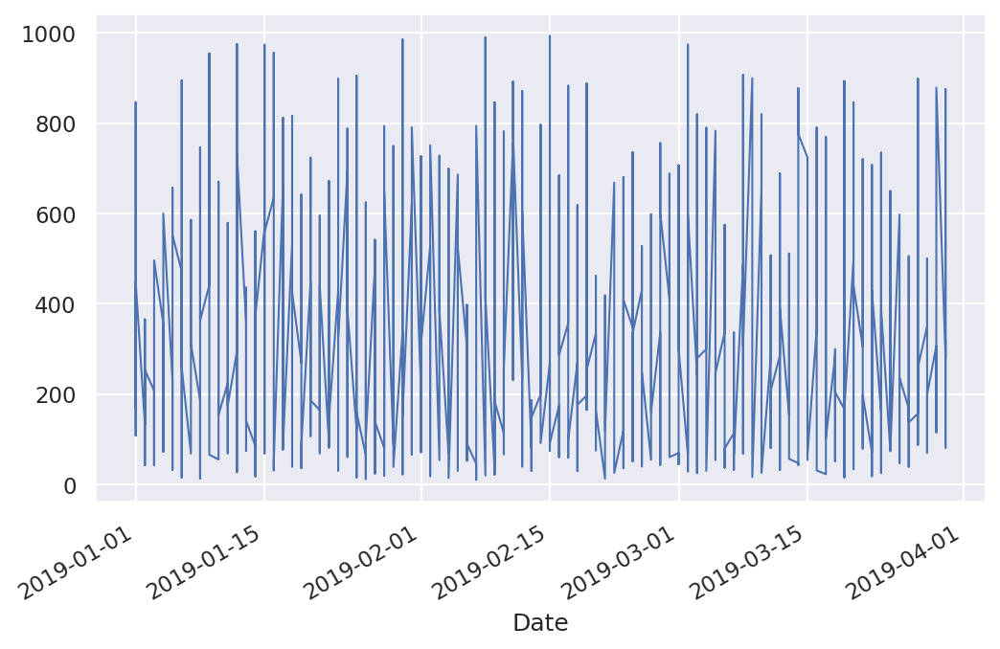

In [46]:
# lineplot for cogs
df['cogs'].plot(linewidth=1.0)

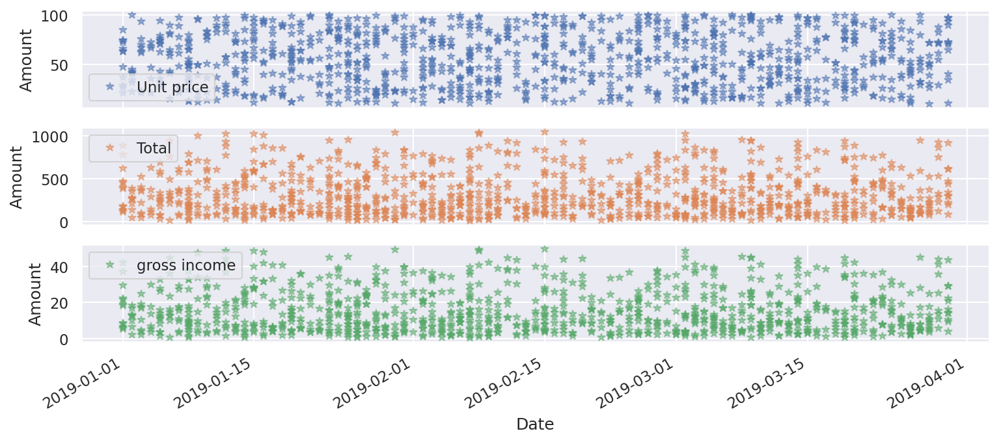

In [47]:
#3. Let's use the dots to plot the data for all the other columns:
cols_to_plot = ['Unit price', 'Total', 'gross income']
axes = df[cols_to_plot].plot(marker='*', alpha=0.5,
linestyle='None',figsize=(12, 5), subplots=True)
for ax in axes:
  ax.set_ylabel('Amount')

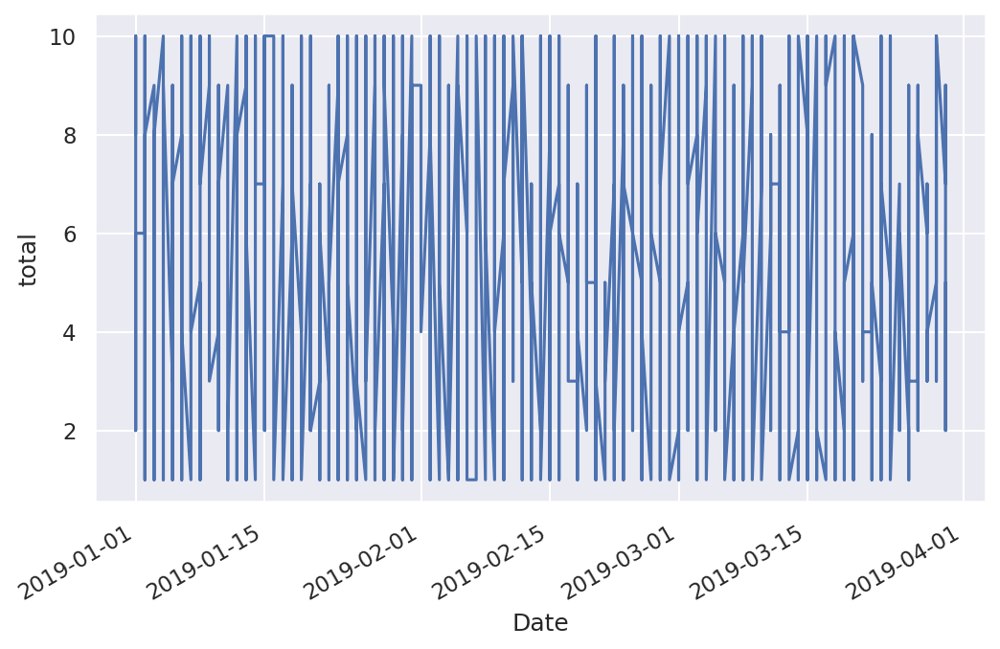

In [48]:
# the quantity in a single year
ax = df.loc['2019', 'Quantity'].plot()
ax.set_ylabel('total');


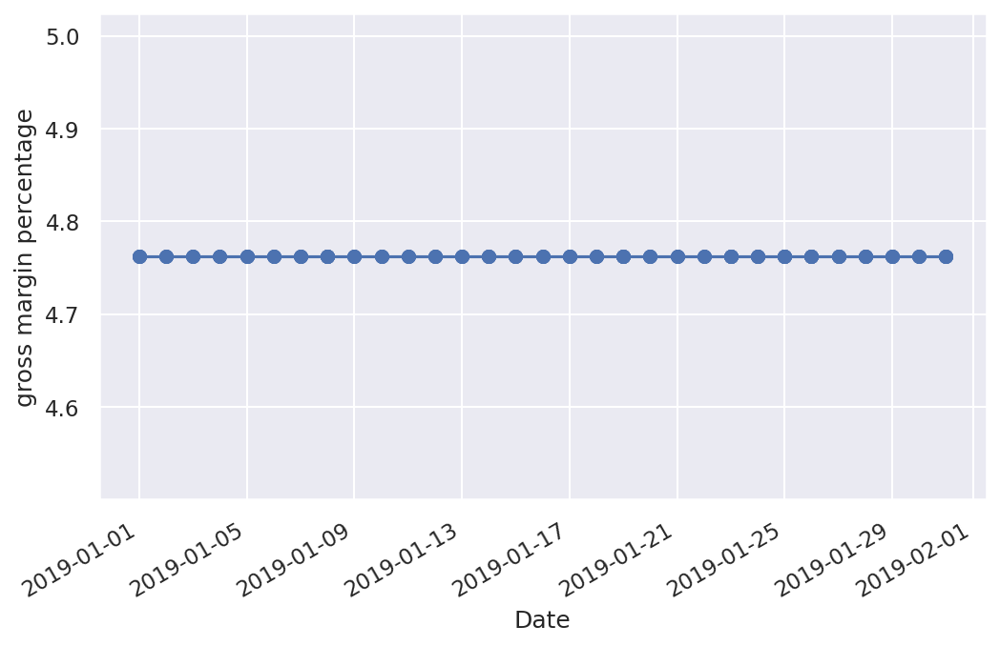

In [49]:
ax = df.loc['2019-01', 'gross margin percentage'].plot(marker='o', linestyle='-')
ax.set_ylabel('gross margin percentage');

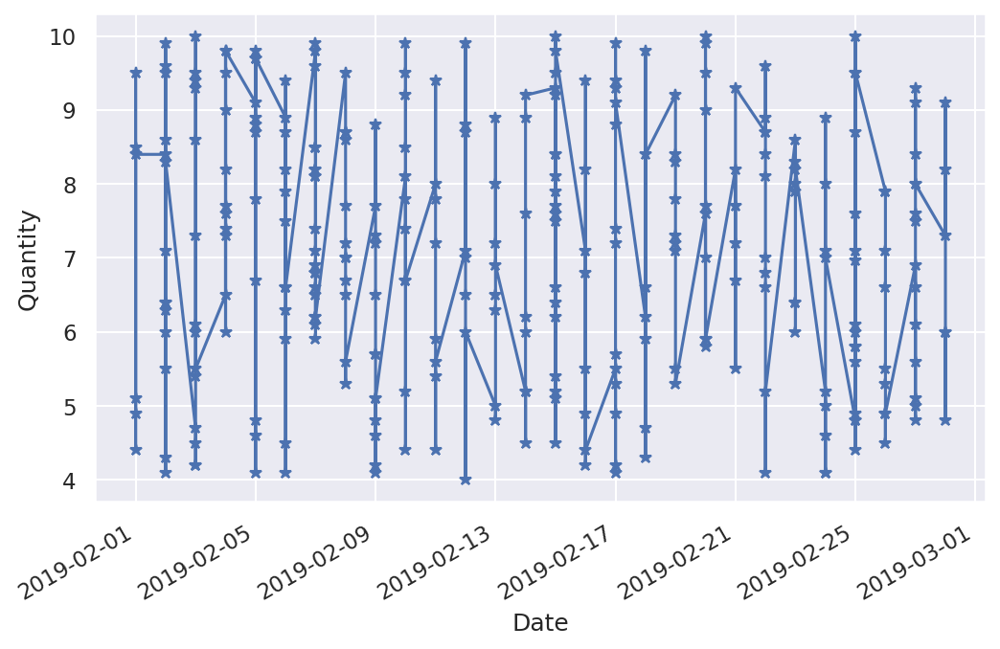

In [50]:
# Particular weeks of february
df = df.sort_index()
ax = df.loc['2019-02-01':'2019-02-28', 'Rating'].plot(marker='*', linestyle='-')
ax.set_ylabel('Quantity');

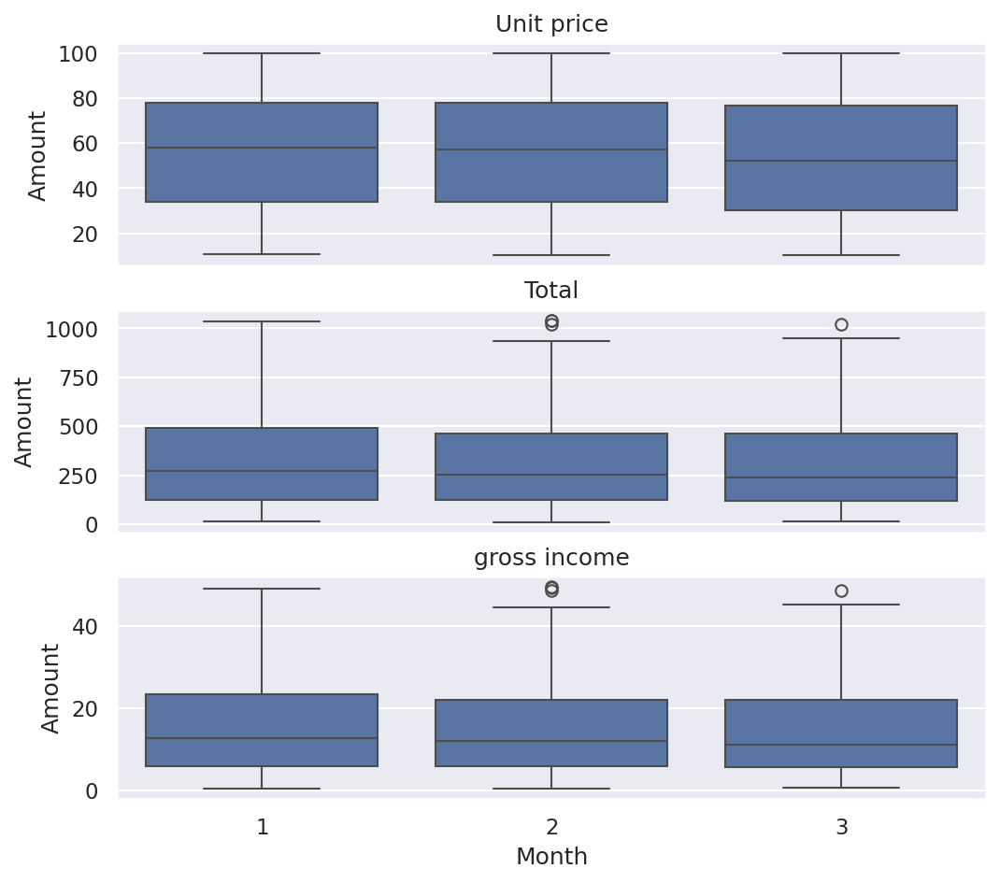

In [51]:
# grouping time series data for 3 months
fig, axes = plt.subplots(3, 1, figsize=(8, 7), sharex=True)
for name, ax in zip(['Unit price', 'Total', 'gross income'], axes):
  sns.boxplot(data=df, x='Month', y=name, ax=ax)
  ax.set_ylabel('Amount')
  ax.set_title(name)
  if ax != axes[-1]:
    ax.set_xlabel('')

In [52]:
# Resampling time series data
columns = ['Unit price', 'Total', 'gross income']
Amount_weekly_mean = df[columns].resample('W').mean()
Amount_weekly_mean

,Unit price,Total,gross income
Date,,,
2019-01-06,55.980909,318.970718,15.189082
2019-01-13,53.810685,335.084918,15.956425
2019-01-20,58.591220,349.919030,16.662811
2019-01-27,57.633011,314.912726,14.995844
2019-02-03,54.140723,341.692139,16.271054
2019-02-10,49.825326,294.585147,14.027864
2019-02-17,60.818194,355.049917,16.907139
2019-02-24,55.046667,288.811075,13.752908
2019-03-03,59.299540,335.858793,15.993276


In [53]:
# 8 months of 2019
start, end = '2019-01', '2019-08'

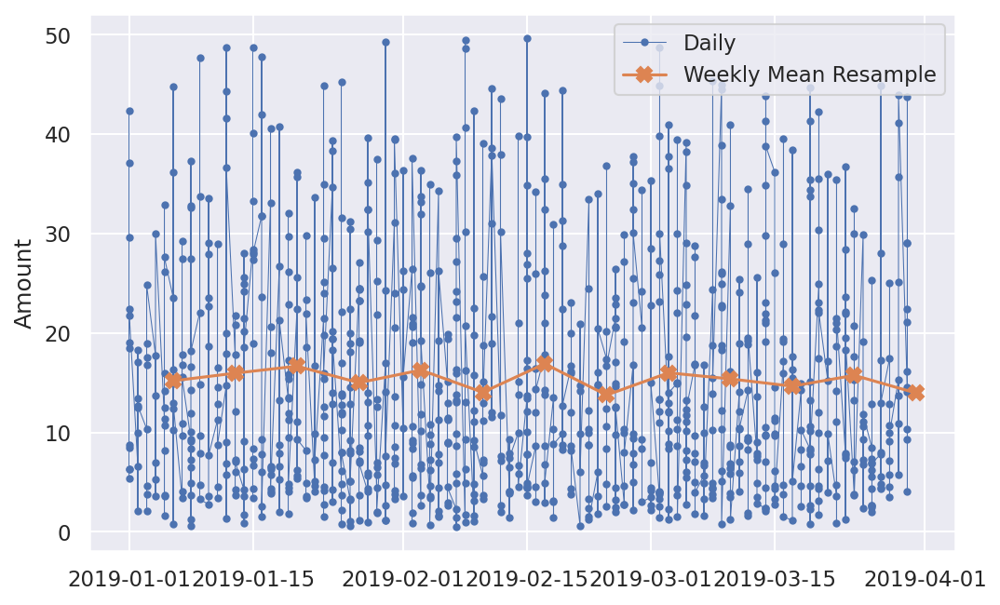

In [54]:
# Plot the graph
fig, ax = plt.subplots()
ax.plot(df.loc[start:end, 'gross income'], marker='.', linestyle='-', linewidth=0.5, label='Daily')
ax.plot(Amount_weekly_mean.loc[start:end, 'gross income'], marker='X', markersize=8, linestyle='-', label='Weekly Mean Resample')
ax.set_ylabel('Amount')
ax.legend();

Module - 4

In [55]:
# Summary of statistical measures for the dataset
df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Quantity_normalized,Unit price_bin,Year,Month
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.0,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905e+00,15.379369,6.973373,0.501111,2.01900,2019.0,1.993000
std,26.494628,2.923431,11.708825,245.885335,234.17651,2.810072e-17,11.708825,1.718448,0.324826,1.43342,0.0,0.835254
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905e+00,0.508500,4.000000,0.000000,0.00000,2019.0,1.000000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905e+00,5.924875,5.500000,0.222222,1.00000,2019.0,1.000000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905e+00,12.088000,7.000000,0.444444,2.00000,2019.0,2.000000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905e+00,22.445250,8.500000,0.777778,3.00000,2019.0,3.000000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905e+00,49.650000,10.000000,1.000000,4.00000,2019.0,3.000000


1-D statistical data analysis

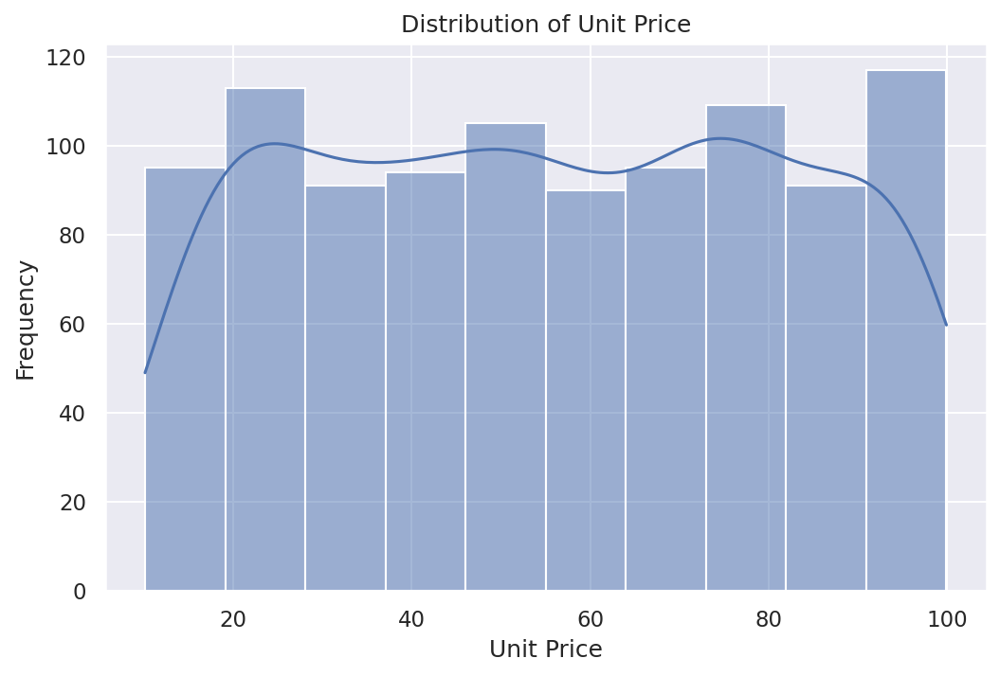

In [58]:
sns.histplot(df['Unit price'], bins=10, kde=True)
plt.title('Distribution of Unit Price')
plt.xlabel('Unit Price')
plt.ylabel('Frequency')
plt.show()


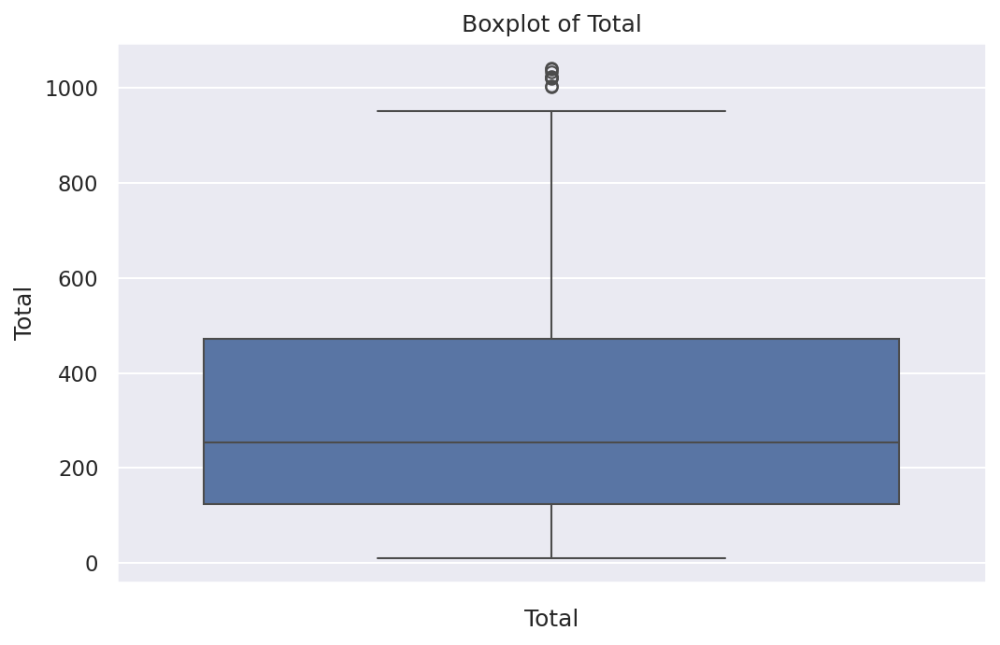

In [59]:
sns.boxplot(df['Total'])
plt.title('Boxplot of Total')
plt.xlabel('Total')
plt.show()

<ipython-input-60-4f0691777d02>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['gross income'], shade=True)


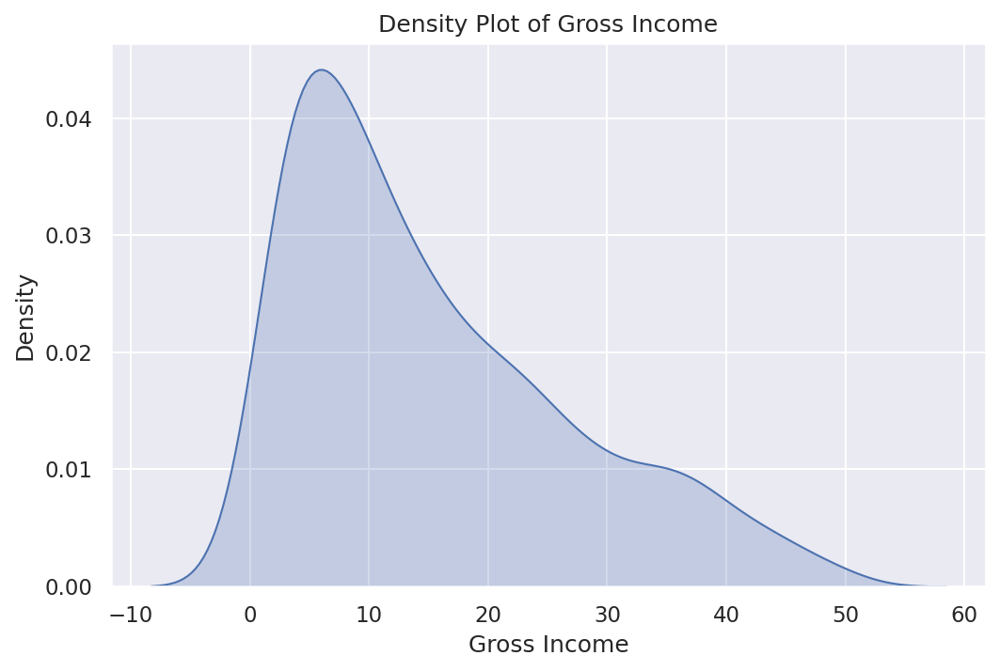

In [60]:
sns.kdeplot(df['gross income'], shade=True)
plt.title('Density Plot of Gross Income')
plt.xlabel('Gross Income')
plt.show()

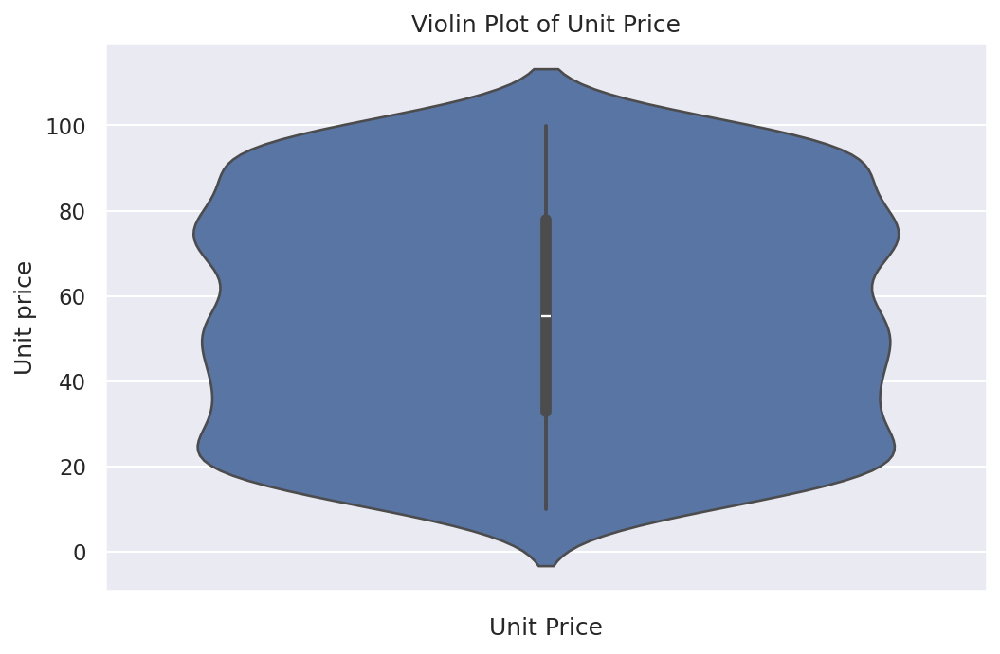

In [61]:
sns.violinplot(y=df['Unit price'])
plt.title('Violin Plot of Unit Price')
plt.xlabel('Unit Price')
plt.show()

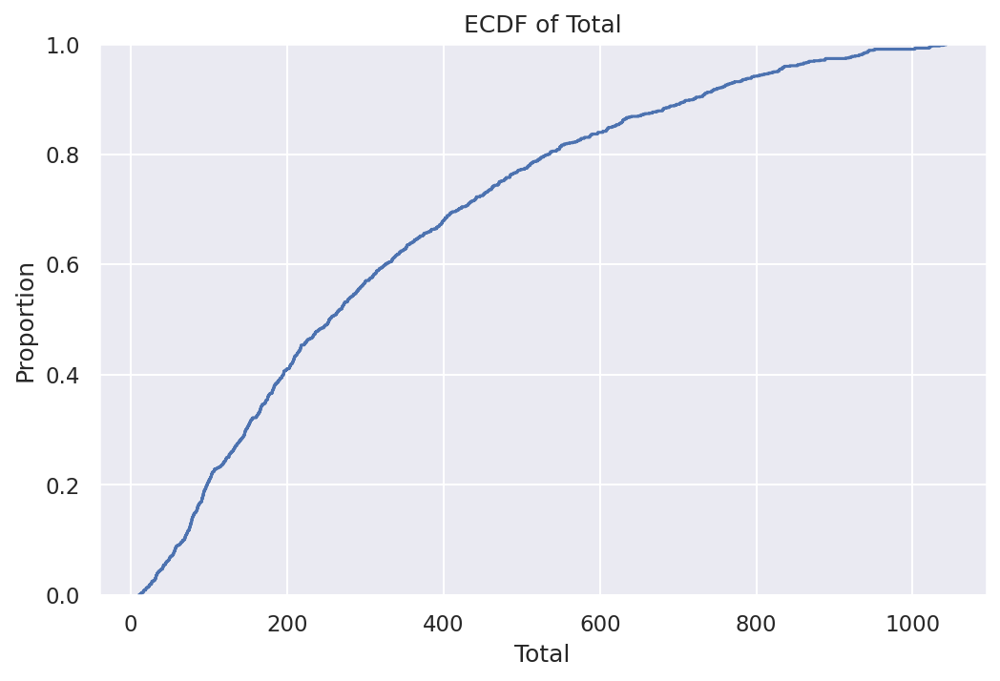

In [62]:
sns.ecdfplot(df['Total'])
plt.title('ECDF of Total')
plt.xlabel('Total')
plt.show()


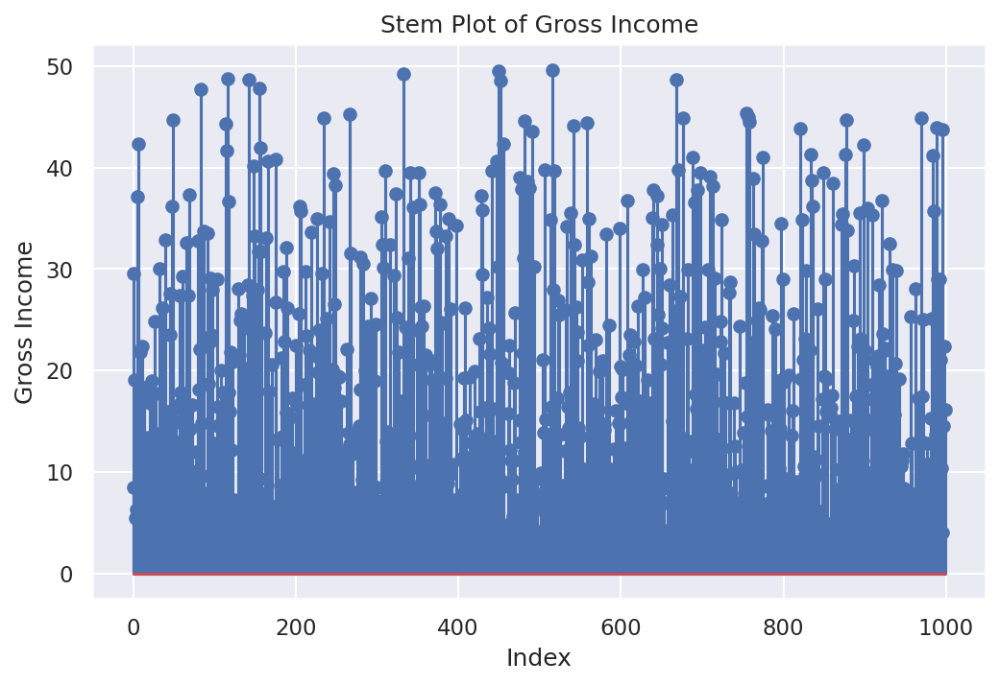

In [63]:
plt.stem(df['gross income'])
plt.title('Stem Plot of Gross Income')
plt.xlabel('Index')
plt.ylabel('Gross Income')
plt.show()

2-D Statistical data analysis

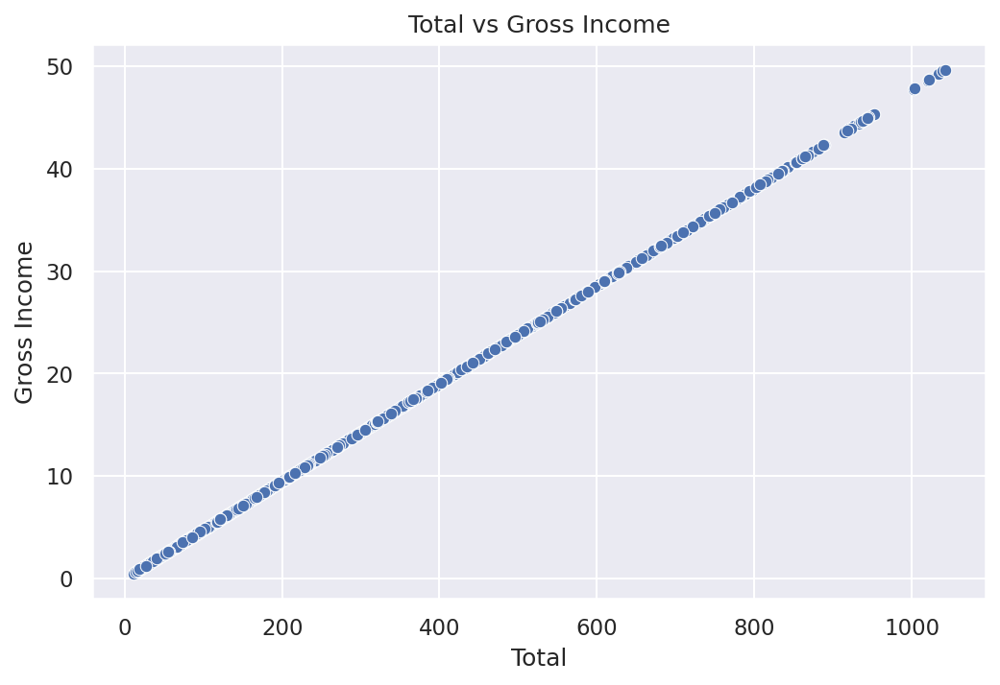

In [64]:
sns.scatterplot(x='Total', y='gross income', data=df)
plt.title('Total vs Gross Income')
plt.xlabel('Total')
plt.ylabel('Gross Income')
plt.show()

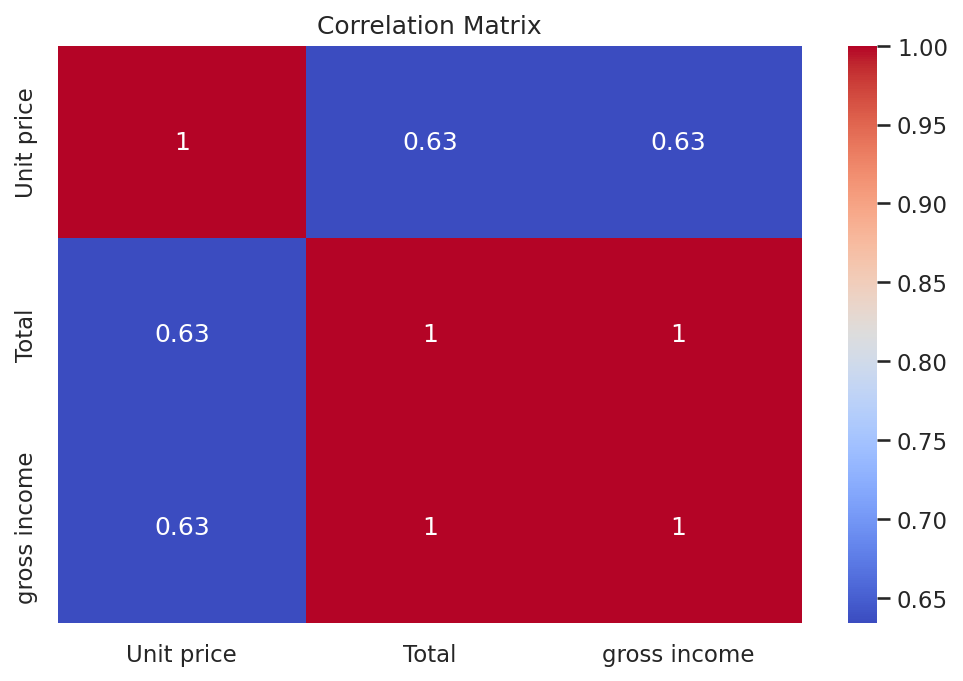

In [65]:
correlation = df[['Unit price', 'Total', 'gross income']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

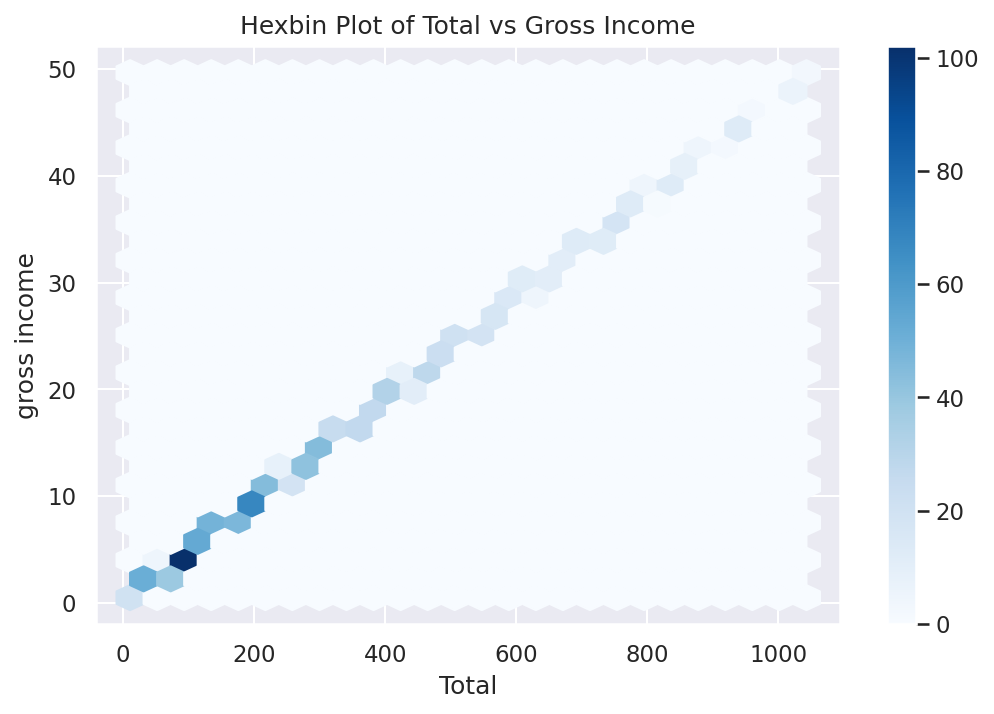

In [80]:
df.plot.hexbin(x='Total', y='gross income', gridsize=25, cmap='Blues')
plt.title('Hexbin Plot of Total vs Gross Income')
plt.show()

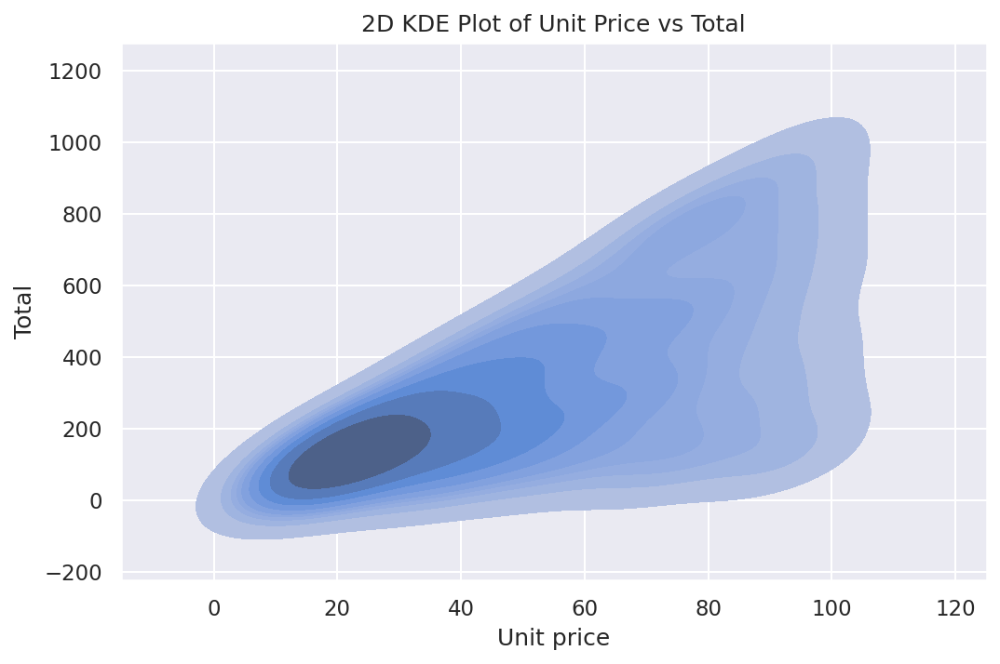

In [81]:
sns.kdeplot(x='Unit price', y='Total', data=df, fill=True)
plt.title('2D KDE Plot of Unit Price vs Total')
plt.show()

contingency table

In [66]:
df['Total_category'] = pd.cut(df['Total'], bins=[0, 100, 500, 1000], labels=['Low', 'Medium', 'High'])

contingency_table = pd.crosstab(df['Month'], df['Total_category'])
print(contingency_table)


Total_category  Low  Medium  High
Month                            
1                70     197    80
2                63     172    65
3                75     196    73


n-D Statistical data analysis

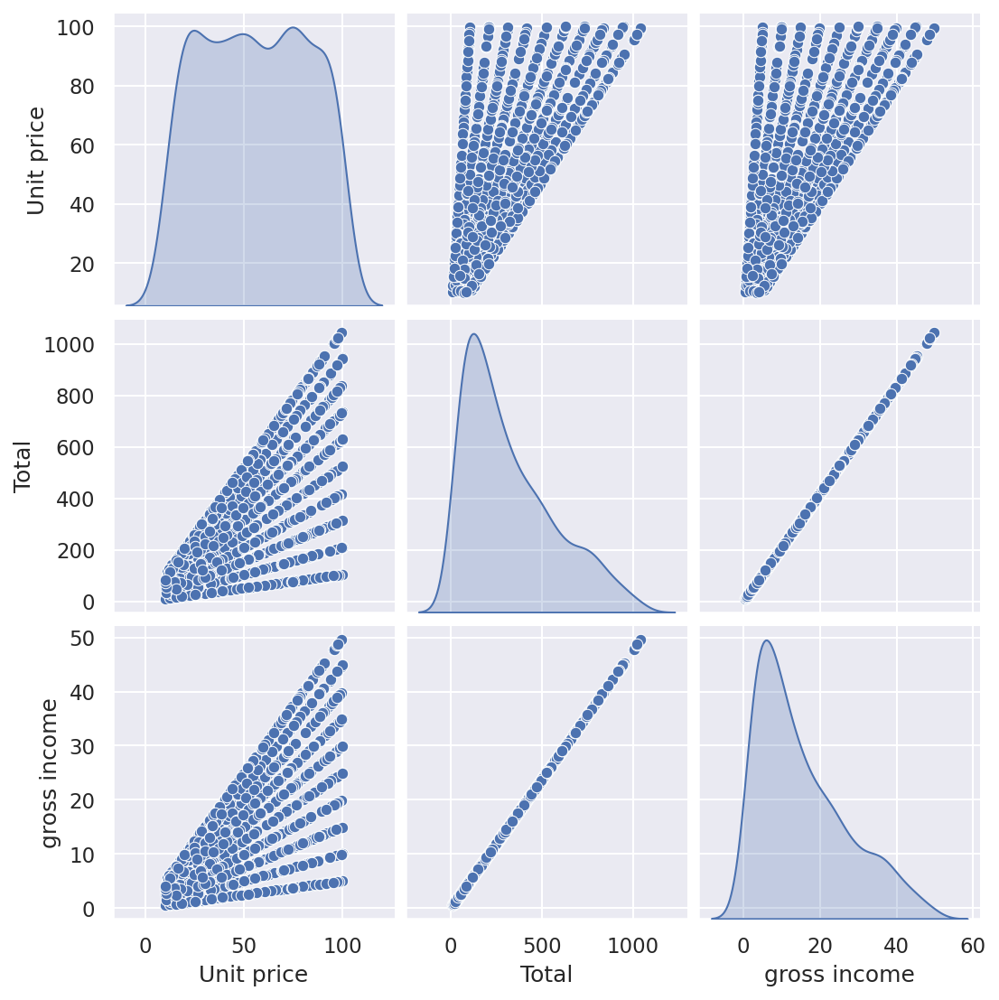

In [67]:
sns.pairplot(df[['Unit price', 'Total', 'gross income']], diag_kind='kde')
plt.show()

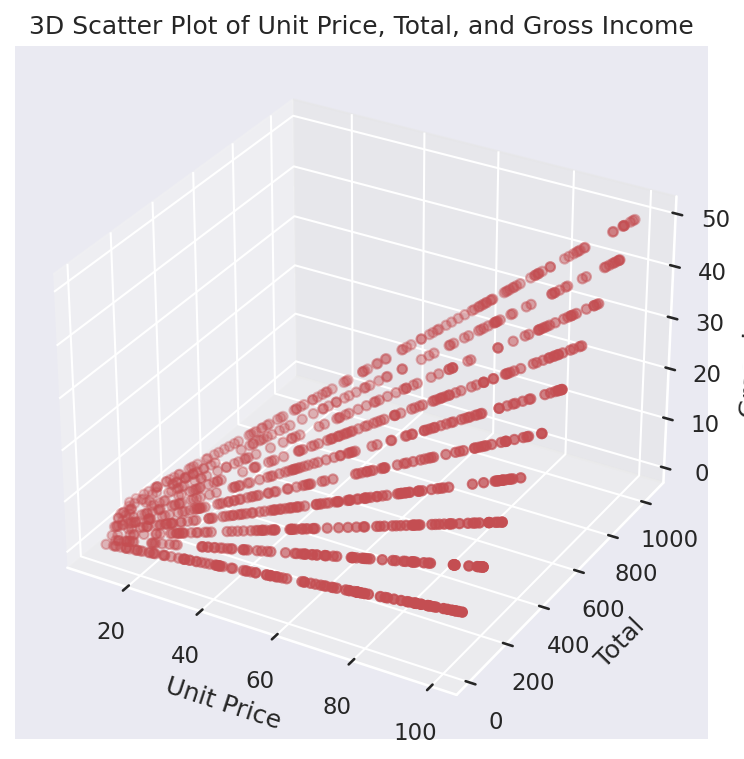

In [68]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['Unit price'], df['Total'], df['gross income'], c='r', marker='o')
ax.set_xlabel('Unit Price')
ax.set_ylabel('Total')
ax.set_zlabel('Gross Income')
plt.title('3D Scatter Plot of Unit Price, Total, and Gross Income')
plt.show()

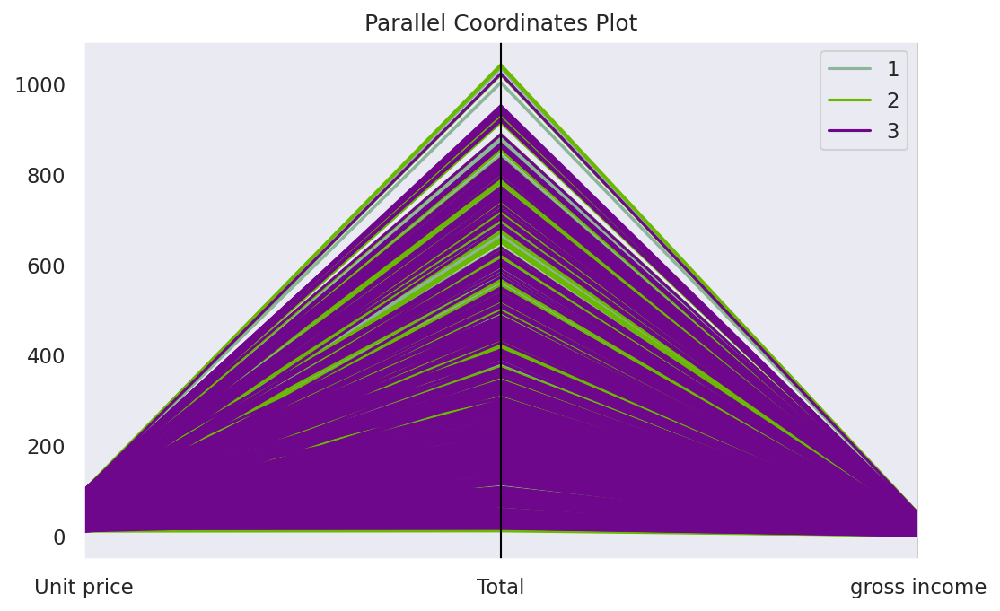

In [69]:
from pandas.plotting import parallel_coordinates

parallel_coordinates(df[['Month', 'Unit price', 'Total', 'gross income']], class_column='Month')
plt.title('Parallel Coordinates Plot')
plt.show()

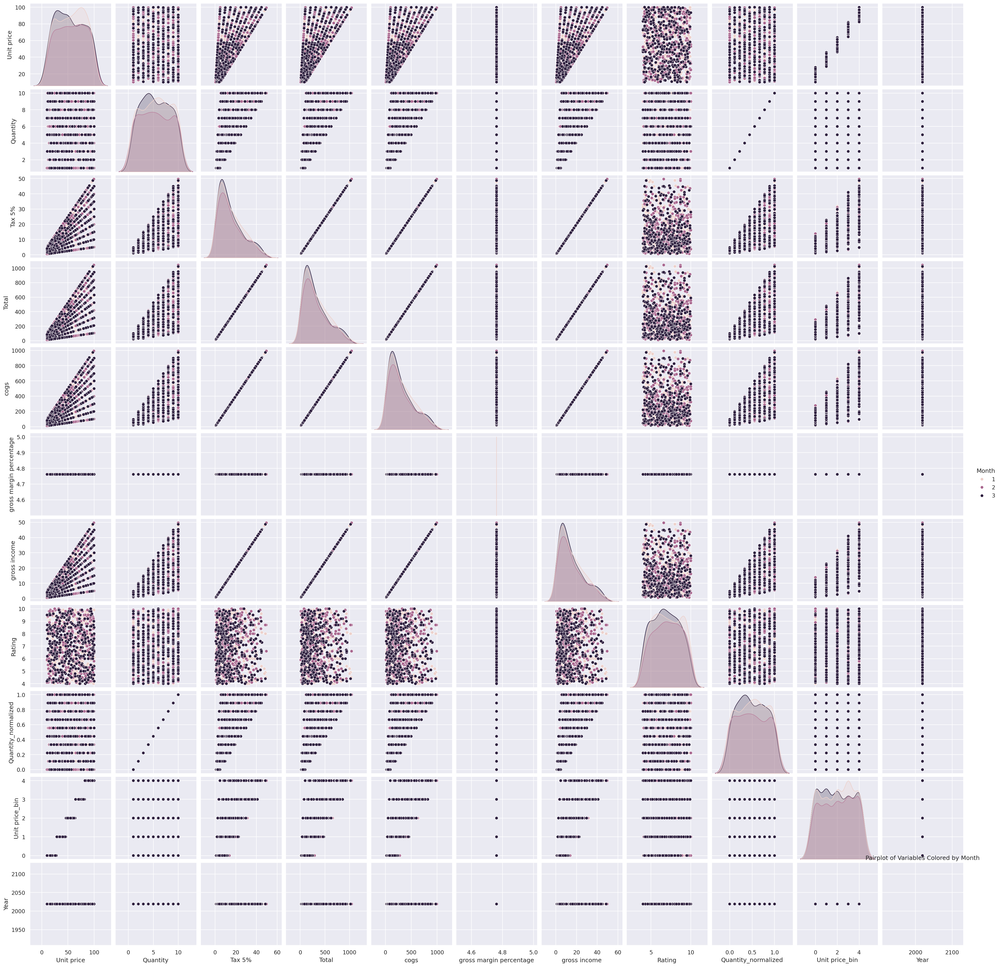

In [70]:
sns.pairplot(df, hue='Month')
plt.title('Pairplot of Variables Colored by Month')
plt.show()

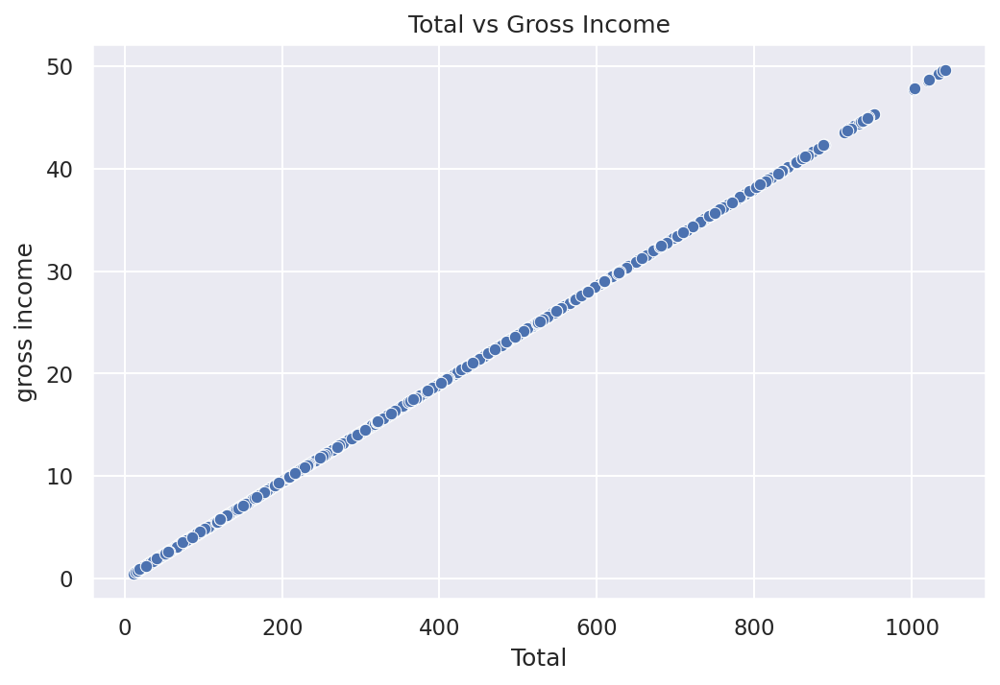

In [77]:
# Scatter plot
sns.scatterplot(x='Total', y='gross income', data=df)
plt.title('Total vs Gross Income')
plt.show()

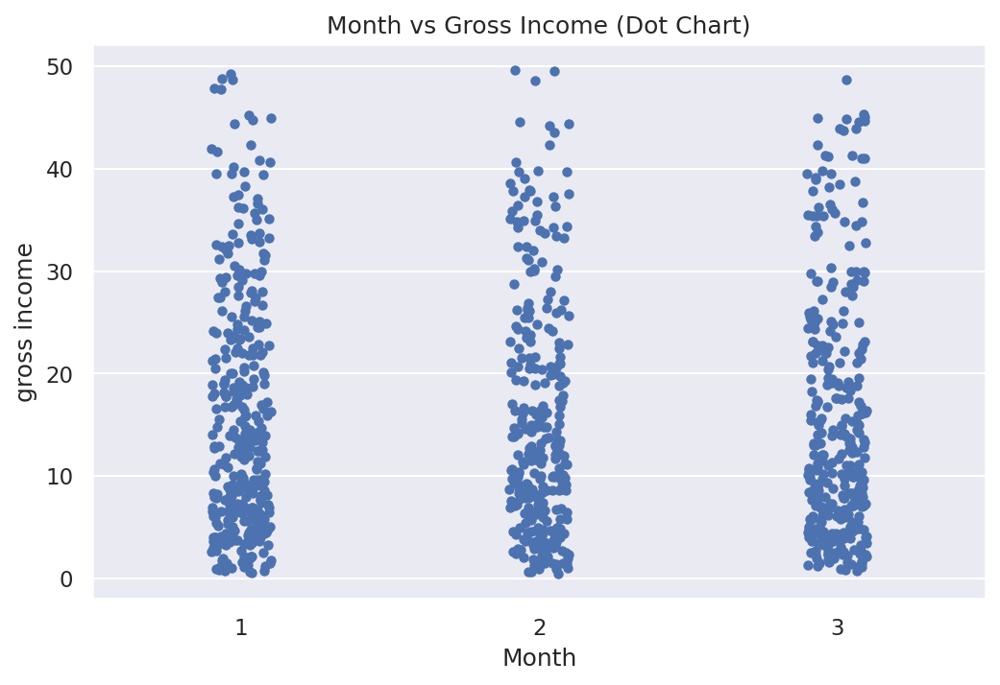

In [72]:
# Dot plot
sns.stripplot(x='Month', y='gross income', data=df, jitter=True)
plt.title('Month vs Gross Income (Dot Chart)')
plt.show()

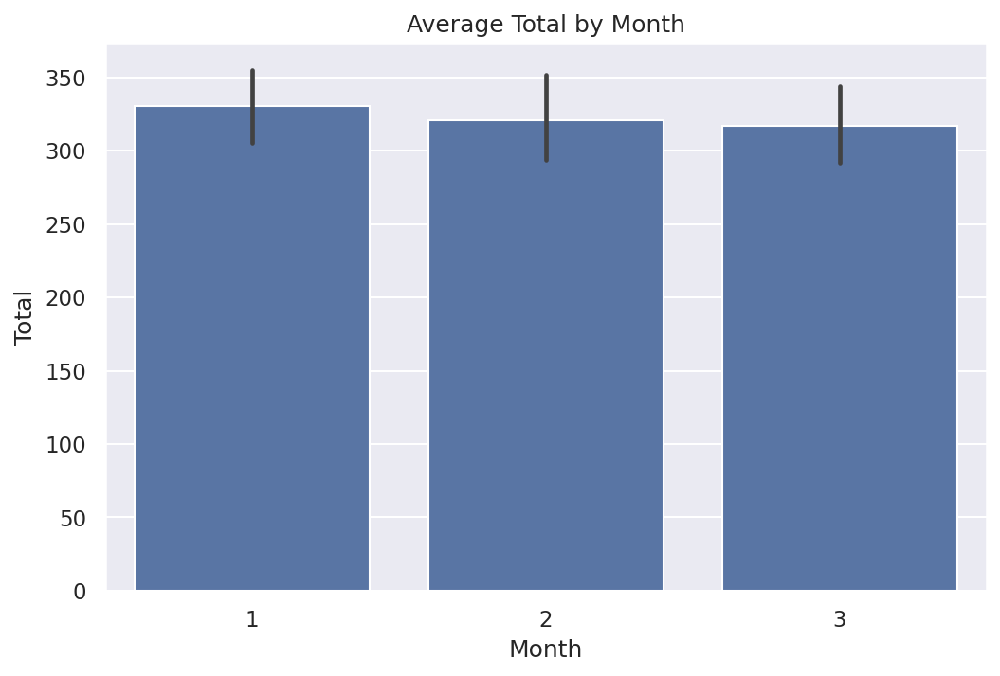

In [78]:
# barplot
sns.barplot(x='Month', y='Total', data=df, estimator=np.mean)
plt.title('Average Total by Month')
plt.show()